In [1]:
import os
import math

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec
from sklearn.linear_model import LinearRegression as linreg

import suite2p as s2p

import TwoPUtils
import STX3KO_analyses as stx



%matplotlib inline

%load_ext autoreload
%autoreload 2

In [2]:
stx.ymaze_sess_deets.KO_sessions.keys()

dict_keys(['4467975.1', '4467975.2', '4467975.3', '4467975.4', '4467975.5'])

In [2]:
write_folder = os.path.join('/mnt','BigDisk','2P_scratch')
mouse = '4467975.4'

file_list = ({'date': '28_09_2020', 'scene':'YMaze_LNovel','session':1,'scan':5},
             {'date': '29_09_2020', 'scene':'YMaze_LNovel','session':1,'scan':3},
             {'date': '30_09_2020', 'scene':'YMaze_LNovel','session':1,'scan':3},
             {'date': '01_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':2},
             {'date': '02_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':4},
             {'date': '03_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':4},
             ({'date': '04_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':2},
             {'date': '04_10_2020', 'scene':'YMaze_RewardReversal','session':1,'scan':5}),
             {'date': '05_10_2020', 'scene':'YMaze_RewardReversal','session':1,'scan':3},
             ({'date': '06_10_2020', 'scene':'YMaze_RewardReversal','session':1,'scan':4},
             {'date': '06_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':8}),
             )

In [3]:
def update_sess_dict(f):
    scan_str = "%s_%03d_%03d" % (f['scene'],f['session'],f['scan'])
    try:
        source_folder  =os.path.join('/media','mplitt','Backup Plus','2P_Data')
        source_stem = os.path.join(source_folder,mouse,f['date'],f['scene'],scan_str)
        info = TwoPUtils.scanner_tools.sbx_utils.loadmat(source_stem+'.mat')
    except:
        source_folder  = os.path.join('/media','mplitt','Backup Plus2','2P_Data')
        source_stem = os.path.join(source_folder,mouse,f['date'],f['scene'],scan_str)
        info = TwoPUtils.scanner_tools.sbx_utils.loadmat(source_stem+'.mat')

    f['mouse']=mouse
    f.update({'scan_file': source_stem + '.sbx',
              'scanheader_file': source_stem + '.mat',
              'vr_filename': os.path.join("/home/mplitt/VR_scratch",f['mouse'],f['date'],"%s_%d.sqlite" %(f['scene'],f['session'])),
              'scan_number': f['scan'],
              'prompt_for_keys': False,
              'VR_only': False,
              'scanner': "NLW",
             })
    return f

In [4]:
1%1

0

In [7]:
for f in file_list:
    if isinstance(f, dict):
        f = update_sess_dict(f)
        scan_str = "%s_%03d_%03d" % (f['scene'],f['session'],f['scan'])
        f['s2p_path']=os.path.join("/mnt/BigDisk/2P_scratch",f['mouse'],f['date'],f['scene'],scan_str,'suite2p')
        sess = stx.session.YMazeSession(**f)
        sess.load_scan_info()
        sess.align_VR_to_2P()
        sess.load_suite2p_data(which_ts=('F', 'Fneu'))
        sess.get_trial_info()
        sess.neuropil_corrected_dff()
        sess.place_cells_calc()
        TwoPUtils.sess.save_session(sess,'/mnt/BigDisk/YMazeSessPkls')
    elif isinstance(f, tuple) or isinstance(f, list):
        total_frames = 0
        s2p_path=os.path.join("/mnt/BigDisk/2P_scratch",mouse,f[0]['date'],'combined','suite2p')
        ops = np.load(os.path.join(s2p_path,"plane0","ops.npy"),allow_pickle=True).all()
        comb_frames = 0
        for _f in f:
            
            _f = update_sess_dict(_f)
            _f['s2p_path'] = os.path.join("/mnt/BigDisk/2P_scratch",f[0]['mouse'],f[0]['date'],'combined','suite2p')
            sess = stx.session.YMazeSession(**_f)
            sess.load_scan_info()
            sess.align_VR_to_2P()
            print(slice(comb_frames,comb_frames+sess.scan_info['max_idx']))
            sess.load_suite2p_data(which_ts=('F', 'Fneu'), frames = slice(comb_frames,comb_frames+sess.scan_info['max_idx']))
            
            sess.get_trial_info()
            sess.neuropil_corrected_dff()
            sess.place_cells_calc()
            TwoPUtils.sess.save_session(sess,'/mnt/BigDisk/YMazeSessPkls')
            
            comb_frames += sess.scan_info['max_idx']
            
            
        print("ops max idx %d, combined sbx max idx %d" % (ops['nframes'], comb_frames))
            
    else:
        print(f) 

/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(97391,) (38708,)
2503.600808489136 2503.535118746842
184 5029
5984 10756
11697 16543
17483 22648
23599 28367
29319 38706


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(96813,) (38081,)
2463.0533097524003 2462.9813036887317
191 4890
5833 10688
11634 16356
17293 22187
23125 27776
28719 38079


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(96344,) (38319,)
2478.4771349166244 2478.3749368367867
193 5226
6177 10804
11755 16513
17455 22259
23204 28034
28978 38318


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(94435,) (37216,)
2407.1433804952 2407.033855482567
180 4951
5892 10545
11489 16257
17196 21834
22774 26961
27903 37214


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(94102,) (37696,)
2438.1901212733706 2438.079838302173
173 4808
6022 10527
11470 16195
17136 21803
22743 27441
28380 37694


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(94565,) (37866,)
2449.1815310763013 2449.0752905507834
193 5128
6067 10755
11698 16414
17367 21985
22994 27596
28543 37864


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(24920,) (10677,)
690.6356745831227 690.5144012127338
slice(0, 10677, None)
168 4987
5928 10676


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(65199,) (26636,)
1722.83198585144 1722.7286508337545
slice(10677, 37313, None)
170 4983
5926 10595
11633 16263
17203 26635


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


ops max idx 37313, combined sbx max idx 37313


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(89820,) (36917,)
2387.8062152602324 2387.6947953511876
166 4823
5801 10595
11537 16286
17229 21889
22832 26984
27924 36916


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(21720,) (9282,)
600.3768317331985 600.2870136432542
slice(0, 9282, None)
170 4456
5396 9281


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports
(62554,) (25114,)
1624.3885800909552 1624.2870136432543
slice(9282, 34396, None)
171 4686
5630 10452
11397 15787
16740 25112


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)
/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:139: RuntimeWarning: Mean of empty slice
  SI = spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


perm 0


/home/mplitt/repos/TwoPUtils/TwoPUtils/spatial_analyses.py:150: RuntimeWarning: Mean of empty slice
  _SI_perm =  spatial_info(np.nanmean(C_trial_mat,axis=0),occ)


ops max idx 34396, combined sbx max idx 34396


In [6]:
ops['nframes']

34396

In [38]:
# load example session
f = file_list[0]
scan_str = "%s_%03d_%03d" % (f['scene'],f['session'],f['scan'])
try:
    source_folder  = os.path.join('/media','mplitt','Backup Plus','2P_Data')
    source_stem = os.path.join(source_folder,mouse,f['date'],f['scene'],scan_str)
    info = TwoPUtils.scanner_tools.sbx_utils.loadmat(source_stem+'.mat')
except:
    source_folder  = os.path.join('/media','mplitt','Backup Plus2','2P_Data')
    source_stem = os.path.join(source_folder,mouse,f['date'],f['scene'],scan_str)
    info = TwoPUtils.scanner_tools.sbx_utils.loadmat(source_stem+'.mat')
        
f['mouse']=mouse
f.update({'scan_file': source_stem + '.sbx',
          'scanheader_file': source_stem + '.mat',
          'vr_filename': os.path.join("/home/mplitt/VR_scratch",f['mouse'],f['date'],"%s_%d.sqlite" %(f['scene'],f['session'])),
          'scan_number': f['scan'],
          'prompt_for_keys': False,
          'VR_only': False,
          'scanner': "NLW",
         })

if f['mouse'] == '4467975.5':
    f['s2p_path']=os.path.join("/home/mplitt/2P_scratch",f['mouse'],f['date'],f['scene'],scan_str,'suite2p')
else:
    f['s2p_path']=os.path.join("/mnt/BigDisk/2P_scratch",f['mouse'],f['date'],f['scene'],scan_str,'suite2p')
    

In [39]:
print(f)
sess = stx.session.YMazeSession(**f)
sess.load_scan_info()
sess.align_VR_to_2P()
sess.load_suite2p_data()
sess.get_trial_info()
sess.neuropil_corrected_dff()

{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'mouse': '4467975.4', 'scan_file': '/media/mplitt/Backup Plus2/2P_Data/4467975.4/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_005.sbx', 'scanheader_file': '/media/mplitt/Backup Plus2/2P_Data/4467975.4/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_005.mat', 'vr_filename': '/home/mplitt/VR_scratch/4467975.4/28_09_2020/YMaze_LNovel_1.sqlite', 'scan_number': 5, 'prompt_for_keys': False, 'VR_only': False, 'scanner': 'NLW', 's2p_path': '/mnt/BigDisk/2P_scratch/4467975.4/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_005/suite2p'}


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:93: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:256: UserWarning: Looking for coaligned suite2p sessions is not implemented yet
  warnings.warn("Looking for coaligned suite2p sessions is not implemented yet")


Fixing teleports


/home/mplitt/repos/TwoPUtils/TwoPUtils/preprocessing.py:134: RuntimeWarning: divide by zero encountered in remainder
  lines = np.array([l % scan_info['fold_lines'] for l in scan_info['line']])


(97391,) (38708,)
2503.599797877716 2503.535118746842
183 5029
5983 10756
11696 16543
17482 22647
23598 28366
29319 38705


In [82]:
# plot licking behavior

In [40]:
sess.place_cells_calc()

perm 0
perm 0


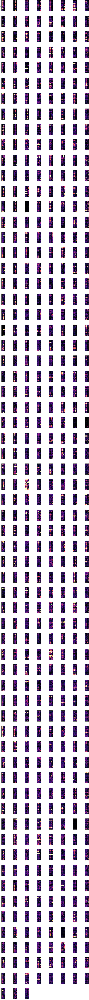

In [85]:
# set up axes
xstride = 3
ystride = 4
nperrow = 8
sigma=1
fig = plt.figure(figsize=[nperrow*xstride,masks.sum()/nperrow*ystride])
# gridspec is fancy subplot controller, can specify how big each one is exactly
gs = gridspec.GridSpec(math.ceil(masks.sum()/nperrow)*ystride,xstride*nperrow) #defined resolution for plot grid
# trial matrics of place cells for jrgeco (_dff_tm) and GRABDA (_dff2_tm)
_dff_tm= sess.trial_matrices['dff'][:,:,masks]

for cell in range(_dff_tm.shape[-1]):
    # do some smoothing in position axis for visualization
    c = _dff_tm[:,:,cell]
    # normalize by mean
    c[np.isnan(c)]=0
#     d[np.isnan(d)]=0
    c/=np.nanmean(c.ravel())
    
    c = sp.ndimage.filters.gaussian_filter1d(c,sigma,axis=1)
    
    # add plots
    row_i = int(ystride*math.floor(cell/nperrow))
    col_i = int(xstride*(cell%nperrow))

    ca_ax = fig.add_subplot(gs[row_i:row_i+ystride-1,col_i]) #specifiy which grid to plot cells
    ca_ax.imshow(c,cmap='magma',aspect='auto',vmin=0,vmax=5)
  
    

    ca_ax.set_yticks([])
    
    ca_ax.set_xticks([])
    
    

    if row_i==0 and col_i==0:
        ca_ax.set_ylabel('Trial #')



In [ ]:
# plot 